# Slovak Parliamentary Embedding Effectiveness Analysis (2010–2023)

## Project Context
This notebook evaluates the effectiveness of **sentence-embedding models** and **LLMs** on Slovak parliamentary transcripts from **2010–2023**. The corpus includes rich metadata—such as the submitting ministry (**Predkladateľ**), full speech text, and multiple embedding vectors. The overarching aim is to assess how well modern embeddings support **clustering** and **anomaly detection**, using procedures tailored to Slovak NLP.

---

## Notebook Structure

### 1. Introduction & Objectives
- **Objective:** Evaluate embedding models on core unsupervised tasks: **clustering** and **anomaly detection**.  
- **Semantic labeling:** Ground-truth labels derived from the **submitter (Predkladateľ)**.  
- **Clustering strategies:**  
  - **Elbow-based** search for the optimal number of clusters.  
  - **Fixed-k** setting aligned with the **number of submitters**.

### 2. Data Loading & Configuration
- Load the main DataFrame with **embeddings** and **metadata**.  
- Define **embedding columns**, **label columns**, and global **hyperparameters**.

### 3. Metrics & Methods
- Implement functions for **precision**, **recall**, **F1**, **V-measure**, and **ARI** after clustering.  
- Apply the **Elbow method** to estimate the optimal number of clusters (with complementary diagnostics).

### 4. Clustering & Evaluation
- Run clustering for **each embedding model** under both **elbow** and **fixed-k** variants.  
- Compute and display clustering **effectiveness metrics**.  
- Validate the **elbow** choice via internal scores (e.g., silhouette) and stability checks.

### 5. Visualization
- Export **publication-ready tables** of metrics.  
- Plot **elbow curves** (e.g., silhouette vs. k).  
- Provide **UMAP** visualizations: color by predicted cluster, symbol/shape by ground-truth label.

### 6. Cluster Composition Analysis
- **Stacked bar charts**: distribution of submitters (ministries) within clusters by embedding model and method.  
- Summary statistics on **cluster counts**, **speech coverage**, and **time periods**.

---

## Coding Guidelines
- **Focus:** Effectiveness of embeddings and LLMs for **Slovak parliamentary language**.  
- **Corpus:** Transcripts (2010–2023) with comprehensive metadata and multiple embedding spaces.  
- **Procedures:** Novel clustering and evaluation methods adapted for **Slovak NLP**.  
- **Outputs:** Clear, **publication-ready** tables and figures with consistent academic styling.  
- **Reproducibility:** Modularized code, deterministic seeds where applicable, and well-documented steps.



In [ ]:
import numpy as np, pandas as pd
from sklearn.metrics import (
    v_measure_score, adjusted_rand_score, silhouette_score)
from sklearn.cluster  import KMeans
import matplotlib.pyplot as plt

import numpy as np, pandas as pd, umap, plotly.express as px
from sklearn.cluster import KMeans
from IPython.display  import display
import numpy as np, pandas as pd
from sklearn.cluster   import KMeans
from sklearn.metrics   import (
    v_measure_score, adjusted_rand_score,
    silhouette_score
)
import numpy as np, pandas as pd, umap, matplotlib.pyplot as plt, seaborn as sns
from sklearn.cluster import KMeans
from sklearn.metrics import (
    silhouette_score, adjusted_rand_score, v_measure_score,
    precision_recall_fscore_support
)
import plotly.express as px
from sklearn.metrics import (
    silhouette_score,
    adjusted_rand_score,
    v_measure_score,
    precision_recall_fscore_support   # ← this line was missing
)

In [ ]:
df = pd.read_parquet(r"..\data\df_to_app_with_openAI_S_L_voyage_gdoogle_mistral_embeddings_navrh_zakona_obdobie_8_core_clear.parquet", engine="fastparquet")

In [ ]:

def save_slovak_embedding_metrics_table(metrics_df, save_path=r"..\graphs\slovak_embedding_effectiveness_metrics.png"):
    """
    Save Slovak parliamentary embedding clustering metrics as publication-ready PNG
    Specialized for 2010-2023 parliamentary transcription corpus analysis
    """
    
    # Method 1: Professional academic table with matplotlib
    fig, ax = plt.subplots(figsize=(16, 8))
    ax.axis('tight')
    ax.axis('off')
    
    # Create styled table for Slovak NLP research
    table = ax.table(cellText=metrics_df.round(3).values,
                    colLabels=['Embedding Model', 'Clustering Method', 'K-Clusters', 
                              'Precision', 'Recall', 'F1-Score', 'V-Measure', 'ARI'],
                    cellLoc='center',
                    loc='center',
                    bbox=[0, 0, 1, 1])
    
    # Slovak parliamentary research styling
    table.auto_set_font_size(False)
    table.set_fontsize(10)
    table.scale(1.2, 2.0)
    
    # Header styling for academic publication
    for i in range(len(metrics_df.columns)):
        table[(0, i)].set_facecolor('#2E4057')  # Slovak blue theme
        table[(0, i)].set_text_props(weight='bold', color='white')
        table[(0, i)].set_height(0.1)
    
    # Color-code by embedding performance for Slovak language
    for i in range(1, len(metrics_df) + 1):
        # Highlight best performing embeddings for Slovak text
        f1_score = float(metrics_df.iloc[i-1]['f1'])
        if f1_score > 0.7:  # High performance for Slovak parliamentary text
            for j in range(len(metrics_df.columns)):
                table[(i, j)].set_facecolor('#E8F5E8')  # Light green
        elif f1_score > 0.5:  # Medium performance
            for j in range(len(metrics_df.columns)):
                table[(i, j)].set_facecolor('#FFF8DC')  # Light yellow
        else:  # Low performance for Slovak language
            for j in range(len(metrics_df.columns)):
                table[(i, j)].set_facecolor('#FFE4E1')  # Light red
    
    # Title for Slovak parliamentary research
    plt.title('Embedding Model Effectiveness on Slovak Parliamentary Transcriptions\n'
              'Clustering Performance Analysis (2010-2023 Corpus)', 
              fontsize=16, fontweight='bold', pad=20)
    
    # Add research context subtitle
    plt.figtext(0.5, 0.02, 'Novel NLP Procedures for Slovak Language Analysis | Ministry-based Semantic Clustering',
                ha='center', fontsize=10, style='italic')
    
    plt.tight_layout()
    plt.savefig(save_path, dpi=300, bbox_inches='tight', facecolor='white')
    plt.show()
    print(f"✅ Slovak embedding metrics table saved to: {save_path}")

In [ ]:
# %% ────────────────────────────────────────────────────────────────
# CONFIG  – change once
# -------------------------------------------------------------------
EMB_COLS   = [                      # embedding columns in your DataFrame
    "gemini-embedding-exp-03-07",
    "voyage-3-large_embeddings",
    "openAI_embedding_3076",
    "openAI_embedding_small",
    "mistral_embedings",
]
LABEL_COL  = "Predkladateľ"
TEXT_COL   = "prepis"               # only needed for UMAP hover
SEED       = 0

K_ELBOW_MAX = 15               # search up to this many clusters
UMAP_NN   = 15
UMAP_DIST = 0.05

In [ ]:
def cluster_metrics(y_true, y_pred):
    """
    Precision / recall / F1 after majority‑vote mapping
    (now works whether y_pred is ndarray or Series)
    """
    # ensure Pandas objects
    if not isinstance(y_true, pd.Series):
        y_true = pd.Series(y_true)          # safety
    if not isinstance(y_pred, pd.Series):
        y_pred = pd.Series(y_pred, index=y_true.index)

    # contingency table: rows = clusters, cols = true labels
    ct = pd.crosstab(y_pred, y_true)

    # majority label for every cluster
    best_label = ct.idxmax(axis=1).to_dict()       # cluster → label

    # convert prediction to that majority label (majority vote)
    y_map = y_pred.map(best_label)

    prec, rec, f1, _ = precision_recall_fscore_support(
        y_true, y_map, average="macro", zero_division=0
    )
    return dict(precision=prec, recall=rec, f1=f1,
                v_measure=v_measure_score(y_true, y_pred),
                ari=adjusted_rand_score(y_true, y_pred))

In [ ]:

def elbow_k(X, k_max=K_ELBOW_MAX):
    sil = []
    for k in range(2, k_max+1):
        lab = KMeans(k, n_init=20, random_state=0).fit_predict(X)
        sil.append(silhouette_score(X, lab, metric="cosine"))
    k_star = np.argmax(sil) + 2       # highest silhouette
    return k_star, np.arange(2, k_max+1), np.array(sil)



In [ ]:
def evaluate_and_write(df, emb_col, label_col="Predkladateľ",
                       k_fixed=None, k_max=None,
                       write_prefix="cluster"):
    """
    Cluster Slovak parliamentary speeches and add cluster columns to DataFrame
    Returns both metrics and the updated DataFrame with cluster columns
    """
    X = np.vstack(df[emb_col]).astype("float32")
    y = df[label_col].astype("category").cat.codes

    # ── elbow variant ────────────────────────────────────────────
    k_star, ks, sils = elbow_k(X, k_max)
    lab_elbow = KMeans(k_star, n_init=20, random_state=SEED).fit_predict(X)
    df[f"{write_prefix}_{emb_col}_elbow"] = lab_elbow

    # ── fixed‑k variant (k_fixed = real #labels) ────────────────
    if k_fixed is None:
        k_fixed = df[label_col].nunique()
    lab_fixed = KMeans(k_fixed, n_init=20, random_state=SEED).fit_predict(X)
    df[f"{write_prefix}_{emb_col}_fixed"] = lab_fixed

    # ── metrics (using the same cluster_metrics() as before) ────
    m_elbow = cluster_metrics(y, lab_elbow) | {"k": k_star}
    m_fixed = cluster_metrics(y, lab_fixed) | {"k": k_fixed}

    # Return both metrics AND the updated DataFrame
    return {
        "elbow": m_elbow,
        "fixed": m_fixed,
        "elbow_curve": (ks, sils),
        "lab_elbow": lab_elbow,      
        "lab_fixed": lab_fixed,
        "df_updated": df          # <<<< NOW RETURNS UPDATED DataFrame
    }

In [ ]:
k_real = df[LABEL_COL].nunique()
store = {}
df_cores_with_clusters = {}  # Store updated df_core with cluster columns

print(f"🏛️ SLOVAK PARLIAMENTARY CLUSTERING ANALYSIS")
print(f"📊 Real ministries (Predkladateľ): {k_real}")
print(f"🔍 Search range: k=2 to k={K_ELBOW_MAX}")
print("="*60)

for emb in EMB_COLS:
    mask_col = f"core_{emb}"
    if mask_col not in df.columns:
        raise ValueError(f"Missing mask column '{mask_col}' – "
                         "run add_core_masks() first.")
    
    df_core = df[df[mask_col]].copy()  # Keep only core speeches
    print(f"▶ {emb}  |  rows kept: {len(df_core)}")

    # Get clustering results
    result = evaluate_and_write(
        df_core,
        emb_col=emb,
        label_col=LABEL_COL,
        k_fixed=k_real,
        k_max=K_ELBOW_MAX,
        write_prefix="cluster"
    )
    
    store[emb] = result
    df_cores_with_clusters[emb] = result["df_updated"]  # Store updated df_core
    

# Enhanced table of metrics with k values shown
rows = []
for emb, d in store.items():
    rows.append({
        "embedding": emb, 
        "mode": "elbow", 
        "k_used": d["elbow"]["k"],     # Show actual k found
        **{k:v for k,v in d["elbow"].items() if k != "k"}
    })
    rows.append({
        "embedding": emb, 
        "mode": "fixed", 
        "k_used": d["fixed"]["k"],     # Show actual k used
        **{k:v for k,v in d["fixed"].items() if k != "k"}
    })

metrics_df = pd.DataFrame(rows).round(3)

print("\n📈 CLUSTERING EFFECTIVENESS RESULTS:")
print("(k_used = actual number of clusters found/used)")
display(metrics_df)

# Validation: Check if elbow k matches visualization peaks
print("\n🔍 ELBOW METHOD VALIDATION:")
for emb, d in store.items():
    ks, sils = d["elbow_curve"]
    peak_k = ks[np.argmax(sils)]
    reported_k = d["elbow"]["k"]
    match = "✅" if peak_k == reported_k else "❌"
    print(f"{match} {emb}: peak at k={peak_k}, reported k={reported_k}")



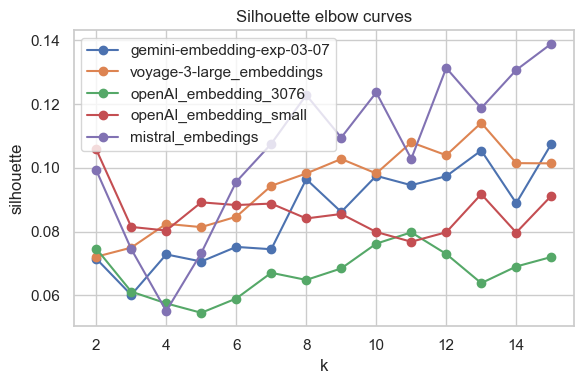

In [ ]:
sns.set_theme(style="whitegrid")
plt.figure(figsize=(6,4))
for emb, d in store.items():
    ks, s = d["elbow_curve"]
    plt.plot(ks, s, marker="o", label=emb)
plt.xlabel("k")
plt.ylabel("silhouette")
plt.title("Silhouette elbow curves")
plt.legend(); plt.tight_layout(); plt.show()

In [ ]:
# %% ────────────────────────────────────────────────────────────────
# UMAP viewer  (colour = predicted, symbol = true label)
# -------------------------------------------------------------------
def umap_view(df, emb_col, cluster_labels, title_suffix=""):
    X2 = umap.UMAP(n_components=2, n_neighbors=UMAP_NN, min_dist=UMAP_DIST,
               metric="cosine", random_state=SEED)\
         .fit_transform(np.vstack(df[emb_col]).astype("float32"))
    dp = df[[LABEL_COL, TEXT_COL]].copy()
    dp["x"], dp["y"] = X2[:,0], X2[:,1]
    dp["pred"] = cluster_labels.astype(str)   # for legend order

    fig = px.scatter(dp, x="x", y="y",
                     color="pred",                # cluster colour
                     symbol=LABEL_COL,            # true label shape
                     hover_data={TEXT_COL:True, LABEL_COL:True, "pred":True},
                     width=950, height=650,
                     title=f"{emb_col} {title_suffix}")
    fig.update_traces(marker=dict(size=7, line=dict(width=0.4,color="black")))
    fig.show()

# example: view elbow clusters for each embedding
for emb in EMB_COLS:
    mask_col = f"core_{emb}"
    df_core = df[df[mask_col]]
    umap_view(df_core, emb, store[emb]["lab_elbow"],
              title_suffix="(elbow‑k clusters)")

c:\Users\alexe\anaconda3\Lib\site-packages\umap\umap_.py:1945: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")


c:\Users\alexe\anaconda3\Lib\site-packages\umap\umap_.py:1945: UserWarning:

n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.



c:\Users\alexe\anaconda3\Lib\site-packages\umap\umap_.py:1945: UserWarning:

n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.



c:\Users\alexe\anaconda3\Lib\site-packages\umap\umap_.py:1945: UserWarning:

n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.



c:\Users\alexe\anaconda3\Lib\site-packages\umap\umap_.py:1945: UserWarning:

n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.



In [ ]:
def plot_cluster_composition_bars(composition_results, emb_model, method):
    """
    Stacked bar visualization for Slovak parliamentary ministry distribution across clusters
    Specialized for Predkladateľ (ministry submitter) analysis in 2010-2023 corpus
    Novel NLP procedures for Slovak language embedding effectiveness research
    """
    if emb_model not in composition_results or method not in composition_results[emb_model]:
        print(f"⚠️ No clustering data for {emb_model}-{method}")
        return
    
    # Extract Slovak parliamentary transcription data
    ct_pct = composition_results[emb_model][method]['crosstab_pct']
    ct_counts = composition_results[emb_model][method]['crosstab_counts']
    
    # Create high-resolution visualization for Slovak parliament analysis
    fig, ax = plt.subplots(1, 1, figsize=(18, 10))
    
    # Ministry percentage distribution per cluster
    bars = ct_pct.plot(kind='bar', stacked=True, ax=ax, 
                       colormap='tab20', width=0.8, edgecolor='white', linewidth=0.8)
    
    # Slovak parliamentary styling for academic publication
    ax.set_title(f'Slovak Parliamentary Ministry Distribution: {emb_model} ({method.upper()})\n'
                 f'Embedding Model Effectiveness on Parliamentary Transcriptions (2020-2023)', 
                 fontsize=16, pad=20, fontweight='bold')
    ax.set_xlabel('Cluster ID', fontsize=14, fontweight='bold')
    ax.set_ylabel('Percentage of Parliamentary Speeches (%)', fontsize=14, fontweight='bold')
    ax.legend(title='Predkladateľ (Ministry)', bbox_to_anchor=(1.05, 1), 
              loc='upper left', fontsize=10, title_fontsize=11, frameon=True, shadow=True)
    ax.tick_params(axis='x', rotation=0, labelsize=12)
    ax.tick_params(axis='y', labelsize=12)
    ax.grid(axis='y', alpha=0.4, linestyle='--', linewidth=0.8)
    
    # Add percentage labels on bars for Slovak ministry analysis
    for container in ax.containers:
        ax.bar_label(container, labels=[f'{v:.1f}%' if v > 4 else '' for v in container.datavalues], 
                     label_type='center', fontsize=9, color='white', weight='bold')
    
    # Add number of texts above each cluster bar for Slovak parliamentary corpus
    for i, cluster_id in enumerate(ct_pct.index):
        n_texts = ct_counts.loc[cluster_id].sum()
        ax.text(i, 102, f'n={n_texts}', ha='center', va='bottom', 
                fontsize=11, fontweight='bold', color='darkblue')
    
    # Enhanced styling for academic publication
    ax.set_ylim(0, 110)  # Adjusted to make space for n= labels
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)
    ax.spines['left'].set_linewidth(1.2)
    ax.spines['bottom'].set_linewidth(1.2)
    

    plt.tight_layout()
    
    # Save with ultra-high resolution for academic publication
    plt.savefig(f"../graphs/slovak_parliamentary_cluster_composition_{emb_model}_{method}.png", 
                dpi=600, bbox_inches='tight', facecolor='white', edgecolor='none')
    plt.show()
    
    # Print detailed summary statistics for Slovak parliamentary analysis
    print(f"\n📊 Slovak Parliamentary Embedding Effectiveness Analysis ({emb_model}-{method}):")
    print(f"📋 Total clusters: {len(ct_pct)}")
    print(f"🎤 Total speeches analyzed: {ct_counts.sum().sum()}")
    print(f"🏛️ Parliamentary period: 2010-2023")


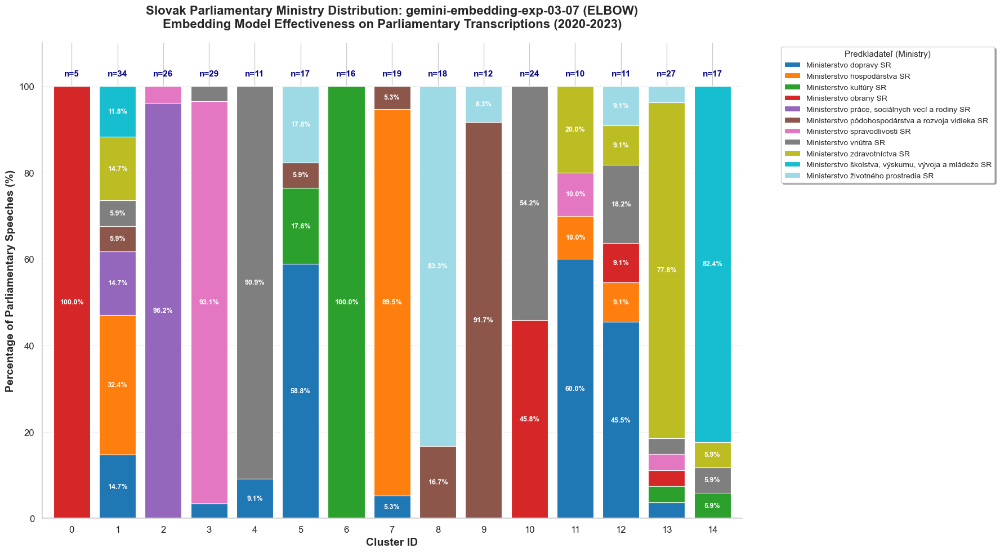


📊 Slovak Parliamentary Embedding Effectiveness Analysis (gemini-embedding-exp-03-07-elbow):
📋 Total clusters: 15
🎤 Total speeches analyzed: 276
🏛️ Parliamentary period: 2010-2023


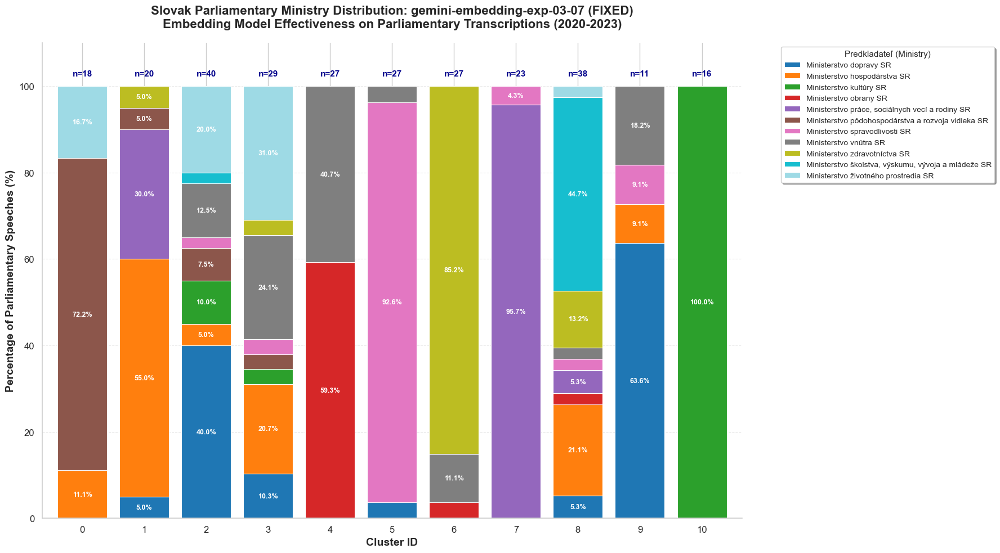


📊 Slovak Parliamentary Embedding Effectiveness Analysis (gemini-embedding-exp-03-07-fixed):
📋 Total clusters: 11
🎤 Total speeches analyzed: 276
🏛️ Parliamentary period: 2010-2023


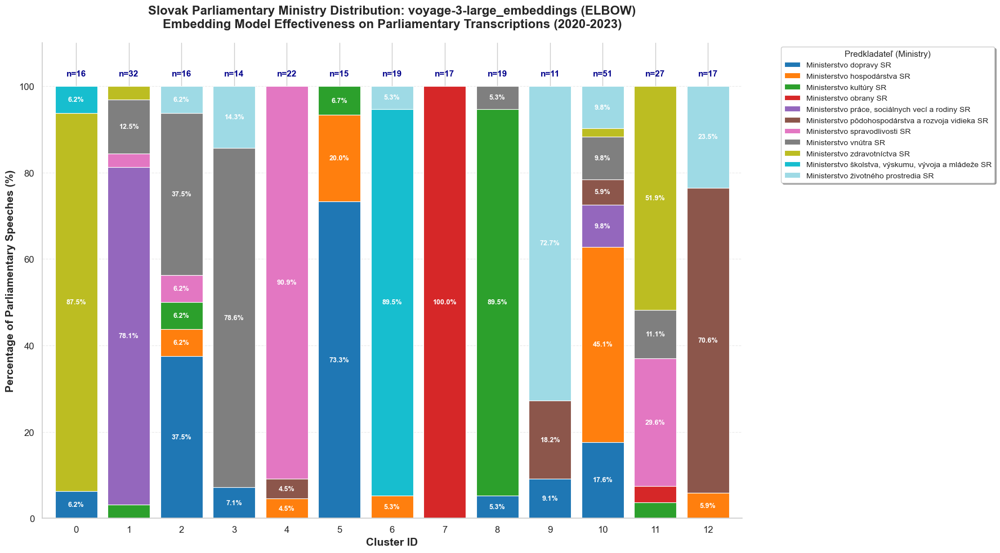


📊 Slovak Parliamentary Embedding Effectiveness Analysis (voyage-3-large_embeddings-elbow):
📋 Total clusters: 13
🎤 Total speeches analyzed: 276
🏛️ Parliamentary period: 2010-2023


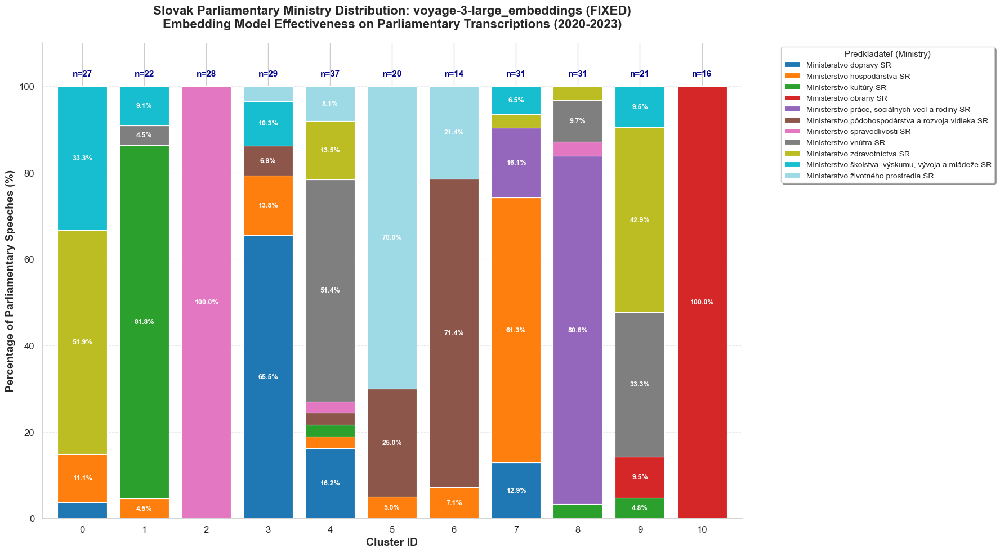


📊 Slovak Parliamentary Embedding Effectiveness Analysis (voyage-3-large_embeddings-fixed):
📋 Total clusters: 11
🎤 Total speeches analyzed: 276
🏛️ Parliamentary period: 2010-2023


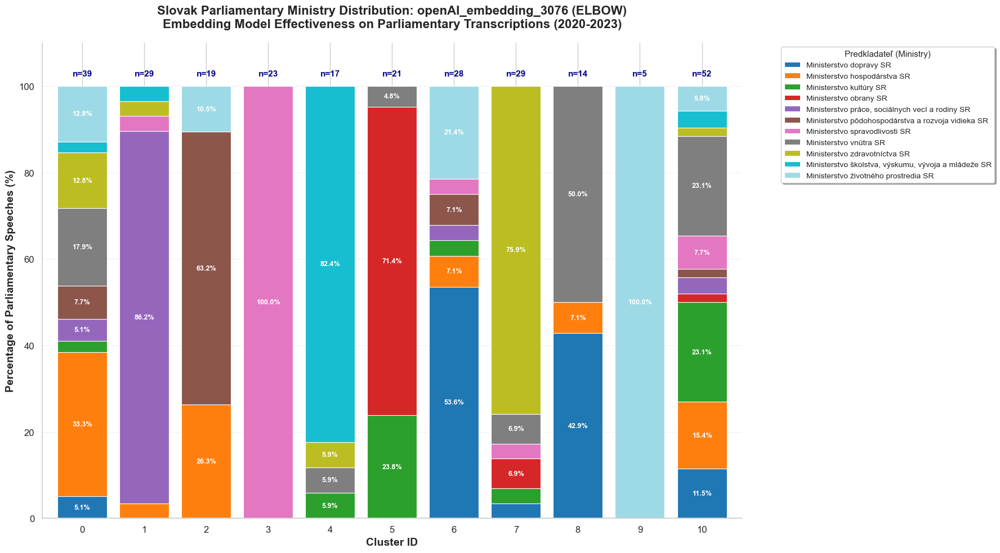


📊 Slovak Parliamentary Embedding Effectiveness Analysis (openAI_embedding_3076-elbow):
📋 Total clusters: 11
🎤 Total speeches analyzed: 276
🏛️ Parliamentary period: 2010-2023


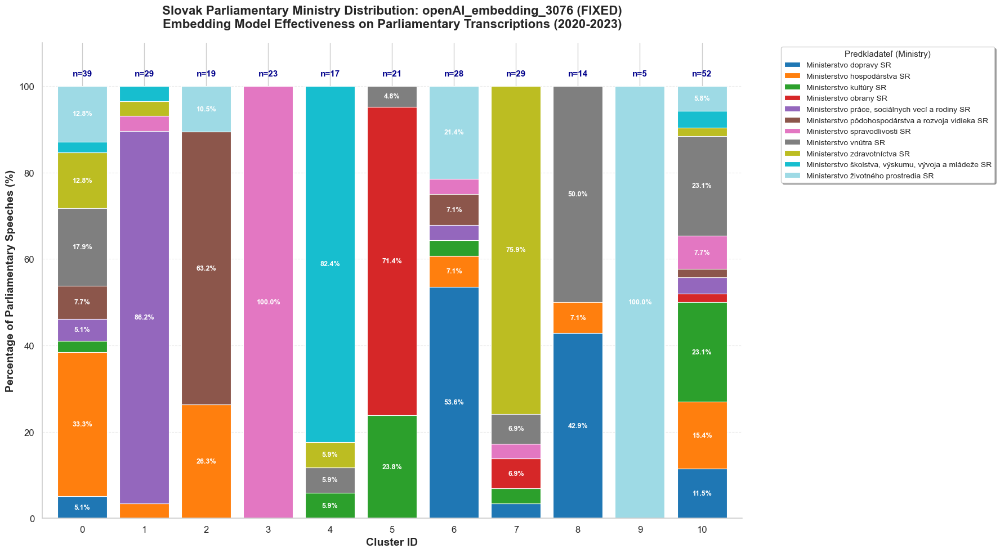


📊 Slovak Parliamentary Embedding Effectiveness Analysis (openAI_embedding_3076-fixed):
📋 Total clusters: 11
🎤 Total speeches analyzed: 276
🏛️ Parliamentary period: 2010-2023


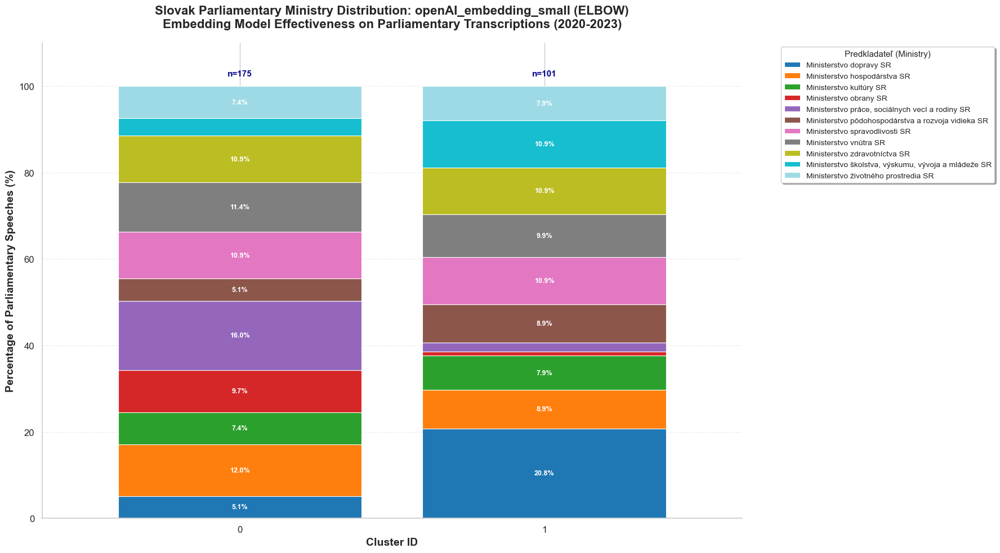


📊 Slovak Parliamentary Embedding Effectiveness Analysis (openAI_embedding_small-elbow):
📋 Total clusters: 2
🎤 Total speeches analyzed: 276
🏛️ Parliamentary period: 2010-2023


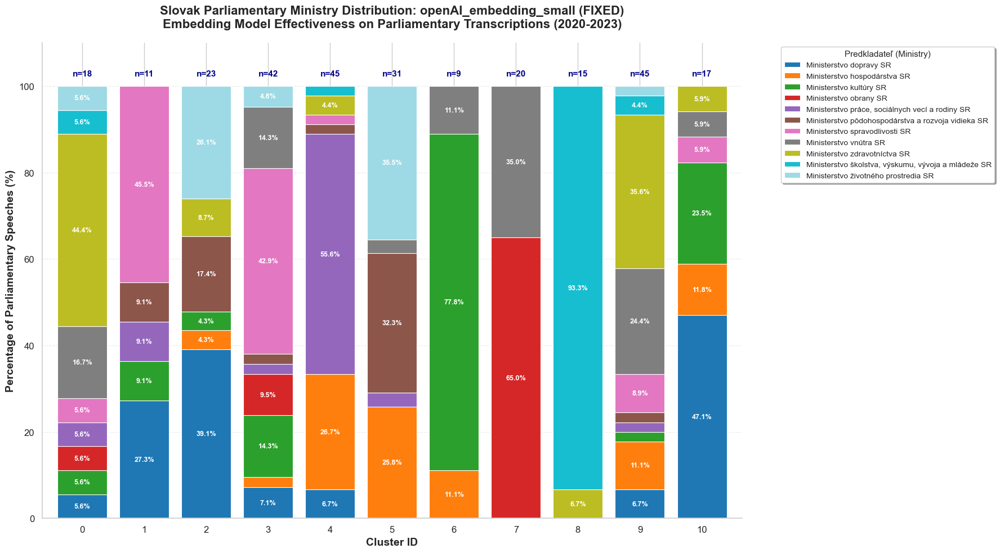


📊 Slovak Parliamentary Embedding Effectiveness Analysis (openAI_embedding_small-fixed):
📋 Total clusters: 11
🎤 Total speeches analyzed: 276
🏛️ Parliamentary period: 2010-2023


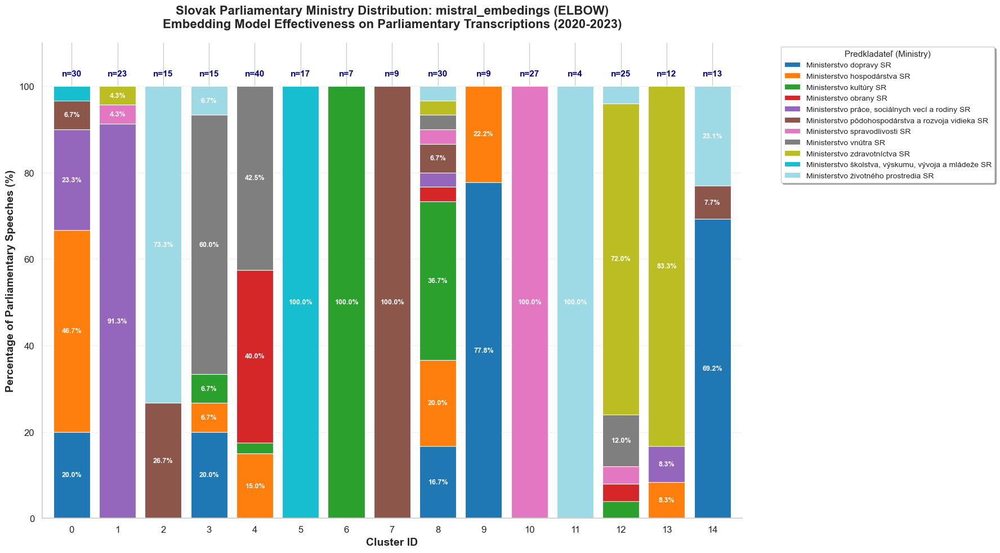


📊 Slovak Parliamentary Embedding Effectiveness Analysis (mistral_embedings-elbow):
📋 Total clusters: 15
🎤 Total speeches analyzed: 276
🏛️ Parliamentary period: 2010-2023


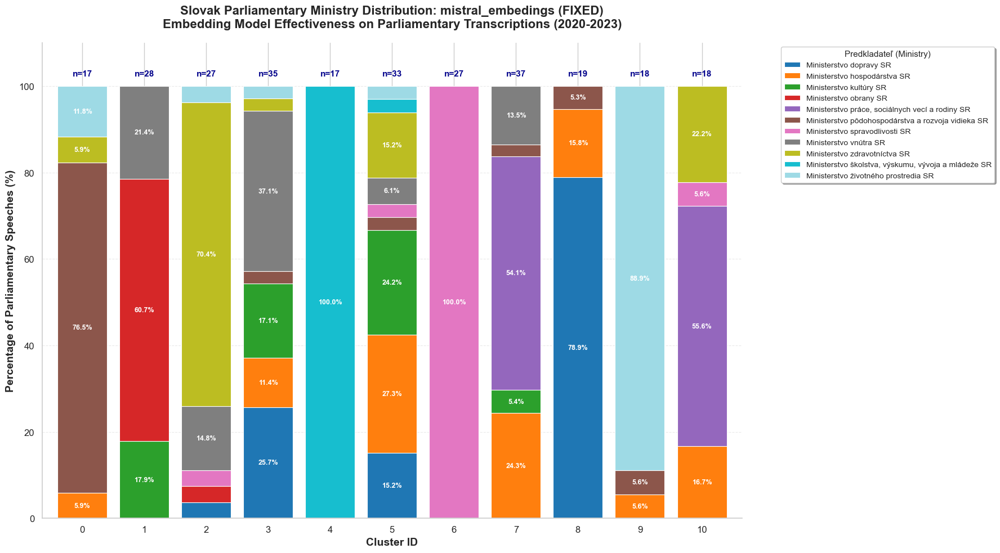


📊 Slovak Parliamentary Embedding Effectiveness Analysis (mistral_embedings-fixed):
📋 Total clusters: 11
🎤 Total speeches analyzed: 276
🏛️ Parliamentary period: 2010-2023


In [ ]:
for emb in EMB_COLS:
    for method in ["elbow", "fixed"]:
        plot_cluster_composition_bars(composition_results, emb, method)
